In [1]:
!pip install tensorflow

In [2]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

2026-01-14 19:22:46.909277: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-14 19:22:47.712816: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-14 19:22:49.977125: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/keras/src/exp

In [3]:
# Path to your single dataset folder (should have subfolders for each class)
data_dir = '/teamspace/studios/this_studio/Gan_dataset _2/Gan_dataset'  # e.g., 'vegetable_dataset/'

# Parameters
BATCH_SIZE = 16
IMG_SIZE = (256, 256)  # DenseNet121 default input size
NUM_CLASSES = 7
EPOCHS = 10
VAL_SPLIT = 0.2  # 20% for validation
TEST_SPLIT = 0.1  # 10% for testing

In [4]:
# Step 2: Load and preprocess dataset with progress bar
def load_dataset(data_dir):
    images = []
    labels = []

    for class_idx, class_name in enumerate(CLASS_NAMES):
        class_dir = os.path.join(data_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"Warning: Directory {class_dir} not found!")
            continue

        print(f"Loading {class_name} images...")
        for img_file in tqdm(os.listdir(class_dir)):
            img_path = os.path.join(class_dir, img_file)
            try:
                with Image.open(img_path) as img:
                    img = img.convert('RGB')  # Ensure RGB format
                    img = img.resize(IMAGE_SIZE)
                    img_array = np.array(img) / 255.0
                    if img_array.shape == (*IMAGE_SIZE, 3):
                        images.append(img_array)
                        labels.append(class_idx)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

    return np.array(images), np.array(labels)

In [5]:
pip install imbalanced-learn


Note: you may need to restart the kernel to use updated packages.


In [6]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from collections import Counter
import tensorflow as tf
import numpy as np
import os

# 🏷️ Get class names
class_names = sorted(os.listdir(data_dir))
NUM_CLASSES = len(class_names)
print("Classes:", class_names)

# 🖼️ Load file paths and labels
file_paths = []
labels = []

for class_idx, class_name in enumerate(class_names):
    class_dir = os.path.join(data_dir, class_name)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        file_paths.append(img_path)
        labels.append(class_idx)

file_paths = np.array(file_paths)
labels = np.array(labels)

# 🧼 Load and preprocess images
X_images = []
for img_path in file_paths:
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.keras.applications.mobilenet_v2.preprocess_input(img)
    X_images.append(img.numpy())

X_images = np.array(X_images)
y = labels

# 🔀 Split data: 15% test first
X_temp, X_test, y_temp, y_test = train_test_split(
    X_images, y, 
    test_size=0.15, 
    random_state=42, 
    stratify=y
)

# 🔀 Now split X_temp into 82.35% train and 17.65% val to make them 70% and 15% of original
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, 
    test_size=0.1765,  # 15% of original = 15/85 ≈ 0.1765
    random_state=42, 
    stratify=y_temp
)

print(f"\nOriginal counts: {Counter(y)}")
print(f"Train: {len(X_train)} (before SMOTE), Val: {len(X_val)}, Test: {len(X_test)}")

# 🔁 Apply SMOTE
print("\nApplying SMOTE to training data...")
X_train_flat = X_train.reshape(X_train.shape[0], -1)
smote = SMOTE(random_state=42)
X_train_smote_flat, y_train_smote = smote.fit_resample(X_train_flat, y_train)
X_train_smote = X_train_smote_flat.reshape(-1, *X_train.shape[1:])

print(f"Before SMOTE: {X_train.shape[0]} samples")
print(f"After SMOTE: {X_train_smote.shape[0]} samples")
print("Class distribution after SMOTE:", Counter(y_train_smote))

# 📦 Create TF datasets
def create_dataset(X, y):
    return tf.data.Dataset.from_tensor_slices((X, tf.one_hot(y, depth=NUM_CLASSES)))

train_ds = create_dataset(X_train_smote, y_train_smote).shuffle(1000).batch(BATCH_SIZE)
val_ds = create_dataset(X_val, y_val).batch(BATCH_SIZE)
test_ds = create_dataset(X_test, y_test).batch(BATCH_SIZE)

print("\n✅ Dataset sizes:")
print(f"Training samples: {len(X_train_smote)}")
print(f"Validation samples: {len(X_val)}")
print(f"Test samples: {len(X_test)}")


Classes: ['Bacterial_Blight', 'Carica_Insect_Hole', 'Curled_Yellow_Spot', 'Mosaic_Virus', 'Yellow_Necrotic_Spots_Holes', 'healthy_leaf', 'pathogen_symptoms']


I0000 00:00:1768418574.325703    3643 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 21087 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:00:04.0, compute capability: 8.9



Original counts: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000})
Train: 4899 (before SMOTE), Val: 1051, Test: 1050

Applying SMOTE to training data...
Before SMOTE: 4899 samples
After SMOTE: 4900 samples
Class distribution after SMOTE: Counter({0: 700, 4: 700, 1: 700, 6: 700, 5: 700, 3: 700, 2: 700})

✅ Dataset sizes:
Training samples: 4900
Validation samples: 1051
Test samples: 1050


In [7]:
# hybrid_fusion_efficientnetv2_transformer.py
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import EfficientNetB3

# ----------------------------
# Helper layers / blocks
# ----------------------------
class AddPositionEmbs(layers.Layer):
    """Add (learnable) positional embeddings to a sequence."""
    def __init__(self, seq_len, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.seq_len = seq_len
        self.embed_dim = embed_dim
        self.pos_emb = self.add_weight(
            shape=(1, seq_len, embed_dim),
            initializer="random_normal",
            trainable=True,
            name="pos_emb"
        )

    def call(self, x):
        return x + self.pos_emb


def transformer_encoder_block(x, num_heads=4, mlp_dim=512, dropout=0.2, name=None):
    """Single Transformer encoder block: LN -> MHA -> Add -> LN -> MLP -> Add"""
    input_dim = int(x.shape[-1])
    # LayerNorm + MHA
    y = layers.LayerNormalization(epsilon=1e-5, name=(None if name is None else name + "_ln1"))(x)
    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=input_dim//num_heads,
                                     name=(None if name is None else name + "_mha"))(y, y)
    attn = layers.Dropout(dropout)(attn)
    x = layers.Add()([x, attn])

    # LayerNorm + MLP
    y = layers.LayerNormalization(epsilon=1e-5, name=(None if name is None else name + "_ln2"))(x)
    y = layers.Dense(mlp_dim, activation="gelu", name=(None if name is None else name + "_mlp_fc1"))(y)
    y = layers.Dropout(dropout)(y)
    y = layers.Dense(input_dim, name=(None if name is None else name + "_mlp_fc2"))(y)
    y = layers.Dropout(dropout)(y)
    out = layers.Add()([x, y])
    return out


# ----------------------------
# Build Hybrid Model
# ----------------------------
def build_hybrid_model(
    input_shape=(256,  256, 3),
    num_classes=7,
    transformer_embed_dim=768,
    transformer_depth=4,
    transformer_num_heads=8,
    transformer_mlp_dim=2048,
    transformer_dropout=0.1,
    cnn_proj_dim=768,
):
    # 1) EfficientNetB3 backbone
    backbone = EfficientNetB3 (include_top=False, weights="imagenet", input_shape=input_shape)
    backbone.trainable = True  # you can freeze initially then fine-tune

    # final CNN feature map: (B, H, W, C)
    cnn_feats = backbone.output  # e.g., (None, 7, 7, 1280) depending on input size

    # 2) Create multi-scale CNN features (simulate low/mid/high) by pooling + conv projection
    # High-level (original resolution)
    high = layers.Conv2D(cnn_proj_dim, kernel_size=1, padding="same", name="proj_high")(cnn_feats)  # (B,H,W,proj)
    high_pool = layers.GlobalAveragePooling2D(name="gap_high")(high)  # (B, proj)

    # Mid-level: pooled spatially (downsample by 2)
    mid = layers.AveragePooling2D(pool_size=2, padding="same")(cnn_feats)
    mid = layers.Conv2D(cnn_proj_dim, kernel_size=1, padding="same", name="proj_mid")(mid)
    mid_pool = layers.GlobalAveragePooling2D(name="gap_mid")(mid)

    # Low-level: pooled more (downsample by 4)
    low = layers.AveragePooling2D(pool_size=4, padding="same")(cnn_feats)
    low = layers.Conv2D(cnn_proj_dim, kernel_size=1, padding="same", name="proj_low")(low)
    low_pool = layers.GlobalAveragePooling2D(name="gap_low")(low)

    # Concatenate pooled CNN multi-scale representation and project
    cnn_concat = layers.Concatenate(name="cnn_multi_scale_concat")([high_pool, mid_pool, low_pool])  # (B, proj*3)
    cnn_emb = layers.Dense(transformer_embed_dim, activation="gelu", name="cnn_emb_fc")(cnn_concat)  # (B, embed_dim)

    # 3) Prepare Transformer sequence: flatten spatial dims of high (or cnn_feats)
    # Use high (projected) as tokens
    # high shape: (B, H, W, proj_dim) -> reshape to (B, N, proj_dim)
    B, H, W, C = None, int(high.shape[1]), int(high.shape[2]), int(high.shape[3])
    seq_len = H * W
    x = layers.Reshape((seq_len, C), name="seq_from_high")(high)  # (B, N, C)
    # project to transformer_embed_dim if needed
    if C != transformer_embed_dim:
        x = layers.Dense(transformer_embed_dim, name="proj_token_dim")(x)

    # 3.1 add learnable CLS token
    cls_token = tf.Variable(initial_value=tf.zeros(shape=(1, 1, transformer_embed_dim)), trainable=True, name="cls_token")
    # tile across batch at call-time using a Lambda layer
    def add_cls_token(t):
        b = tf.shape(t)[0]
        cls = tf.tile(cls_token, (b, 1, 1))
        return tf.concat([cls, t], axis=1)

    x = layers.Lambda(add_cls_token, name="add_cls_token")(x)  # (B, N+1, D)

    # 3.2 add positional embeddings
    x = AddPositionEmbs(seq_len + 1, transformer_embed_dim, name="pos_embs")(x)

    # 4) Transformer encoder stack
    for i in range(transformer_depth):
        x = transformer_encoder_block(
            x,
            num_heads=transformer_num_heads,
            mlp_dim=transformer_mlp_dim,
            dropout=transformer_dropout,
            name=f"trans_enc_{i}"
        )

    # 5) Get CLS representation (first token)
    cls_rep = layers.Lambda(lambda t: t[:, 0, :], name="get_cls")(x)  # (B, D)

    # 6) Fusion: attention-based fusion where CNN_emb is query, Transformer sequence is key/value
    # Prepare query as (B, 1, D)
    cnn_query = layers.Reshape((1, transformer_embed_dim), name="cnn_query_reshape")(cnn_emb)  # (B,1,D)
    # Key/Value: use entire transformer sequence (without CLS) or with; we'll use full sequence
    transformer_seq = x  # (B, N+1, D)

    # MultiHeadAttention: query=cnn_query, value=transformer_seq
    attn_fused = layers.MultiHeadAttention(
        num_heads=transformer_num_heads,
        key_dim=transformer_embed_dim//transformer_num_heads,
        name="fusion_mha"
    )(cnn_query, transformer_seq)  # (B, 1, D)
    attn_fused = layers.Flatten()(attn_fused)  # (B, D)

    # Optionally combine with CLS rep (concatenate then project)
    combined = layers.Concatenate(name="fusion_concat")([attn_fused, cls_rep, cnn_emb])  # (B, D*3)
    combined = layers.LayerNormalization(name="fusion_ln")(combined)
    combined = layers.Dense(transformer_embed_dim, activation="gelu", name="fusion_fc")(combined)
    combined = layers.Dropout(0.2)(combined)

    # 7) Classification head
    logits = layers.Dense(num_classes, name="logits")(combined)
    outputs = layers.Activation("softmax", dtype="float32", name="preds")(logits)

    model = Model(inputs=backbone.input, outputs=outputs, name="EfficientNetB3_Transformer_Fusion")
    return model


# ----------------------------
# Example: create and compile
# ----------------------------
if __name__ == "__main__":
    model = build_hybrid_model(
        input_shape=(256,  256, 3),
        num_classes=7,              # adjust to your dataset classes
        transformer_embed_dim=768,
        transformer_depth=4,
        transformer_num_heads=8,
        transformer_mlp_dim=2048,
        transformer_dropout=0.5,
        cnn_proj_dim=768
    )

    # Compile
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=["accuracy"]
    )

    model.summary()


Model: "EfficientNetB3_Transformer_Fusion"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 256, 256,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 256, 256,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 256, 256,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 257, 257,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 128, 128,  │      1,080 │ stem_conv_pad[0]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 128, 128,  │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 128, 128,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 128, 128,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 128, 128,  │        160 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 128, 128,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 128, 128,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 128, 128,  │        960 │ block1a_se_excit

 Total params: 42,343,478 (161.53 MB)

 Trainable params: 42,256,175 (161.19 MB)

 Non-trainable params: 87,303 (341.03 KB)

In [8]:
for images, labels in train_ds.take(1):
    print(labels.shape, labels[:5])


(16, 7) tf.Tensor(
[[1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1.]], shape=(5, 7), dtype=float32)


2026-01-14 19:28:28.445707: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [9]:
!pip install visualkeras

In [10]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# ✅ Define model name manually
model_name = " EfficientNetB3"

# ✅ Callbacks (using correct model name)
checkpoint = ModelCheckpoint(
    f"{model_name}.h5",
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-4
)

# ✅ Train
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,                  # EPOCHS must be integer
    callbacks=[checkpoint, early_stop, reduce_lr]
)



Epoch 1/10


2026-01-14 19:29:43.304970: I external/local_xla/xla/service/service.cc:163] XLA service 0x7550d805a810 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-01-14 19:29:43.305007: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2026-01-14 19:29:46.083305: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-01-14 19:29:57.876204: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91002
2026-01-14 19:30:07.495884: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_123', 4 bytes spill stores, 4 bytes spill loads

2026-01-14 19:30:08.744639: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registe

306/307 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.1810 - loss: 2.2766

2026-01-14 19:32:47.782027: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_132', 4 bytes spill stores, 4 bytes spill loads

2026-01-14 19:32:48.024998: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_7', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:32:48.472494: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_132', 4 bytes spill stores, 4 bytes spill loads

2026-01-14 19:32:48.994552: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:32:49.095960: I external/local_xla/xla/str

307/307 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step - accuracy: 0.1811 - loss: 2.2762

2026-01-14 19:34:29.357327: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_39', 64 bytes spill stores, 64 bytes spill loads

2026-01-14 19:34:29.380716: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 64 bytes spill stores, 64 bytes spill loads

2026-01-14 19:34:29.608495: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_39', 368 bytes spill stores, 368 bytes spill loads

2026-01-14 19:34:30.519276: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 368 bytes spill stores, 368 bytes spill loads

2026-01-14 19:34:30.692903: I external/local

307/307 ━━━━━━━━━━━━━━━━━━━━ 406s 675ms/step - accuracy: 0.2231 - loss: 2.1483 - val_accuracy: 0.2141 - val_loss: 2.3799 - learning_rate: 1.0000e-05
Epoch 2/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.3532 - loss: 1.8313

307/307 ━━━━━━━━━━━━━━━━━━━━ 90s 136ms/step - accuracy: 0.3873 - loss: 1.7498 - val_accuracy: 0.5062 - val_loss: 1.4687 - learning_rate: 1.0000e-05
Epoch 3/10
306/307 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.4939 - loss: 1.5325

307/307 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - accuracy: 0.5251 - loss: 1.4684 - val_accuracy: 0.6679 - val_loss: 1.2635 - learning_rate: 1.0000e-05
Epoch 4/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.6057 - loss: 1.2864

307/307 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - accuracy: 0.6153 - loss: 1.2796 - val_accuracy: 0.7383 - val_loss: 1.1283 - learning_rate: 1.0000e-05
Epoch 5/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.6532 - loss: 1.1894

307/307 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - accuracy: 0.6714 - loss: 1.1594 - val_accuracy: 0.7869 - val_loss: 1.0292 - learning_rate: 1.0000e-05
Epoch 6/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.7318 - loss: 1.0680

307/307 ━━━━━━━━━━━━━━━━━━━━ 42s 135ms/step - accuracy: 0.7386 - loss: 1.0499 - val_accuracy: 0.8202 - val_loss: 0.9522 - learning_rate: 1.0000e-05
Epoch 7/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - accuracy: 0.7692 - loss: 0.9762 - val_accuracy: 0.8107 - val_loss: 0.9534 - learning_rate: 1.0000e-05
Epoch 8/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - accuracy: 0.8116 - loss: 0.9094 - val_accuracy: 0.8078 - val_loss: 0.9616 - learning_rate: 1.0000e-05
Epoch 9/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - accuracy: 0.8269 - loss: 0.8608 - val_accuracy: 0.8002 - val_loss: 0.9808 - learning_rate: 1.0000e-05
Epoch 10/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - accuracy: 0.8545 - loss: 0.8138 - val_accuracy: 0.7964 - val_loss: 0.9659 - learning_rate: 1.0000e-05


In [ ]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


65/66 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

2026-01-14 19:42:37.684964: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_47', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:42:37.809875: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:42:38.876477: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_39', 368 bytes spill stores, 368 bytes spill loads

2026-01-14 19:42:39.001046: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_8', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:42:39.183011: I external/local_xla/xla/s

66/66 ━━━━━━━━━━━━━━━━━━━━ 53s 554ms/step
Classification Report:
                             precision    recall  f1-score   support

           Bacterial_Blight       0.90      0.85      0.87       150
         Carica_Insect_Hole       0.59      0.86      0.70       150
         Curled_Yellow_Spot       0.76      0.70      0.73       150
               Mosaic_Virus       0.99      0.89      0.94       150
Yellow_Necrotic_Spots_Holes       1.00      1.00      1.00       150
               healthy_leaf       0.90      0.76      0.82       150
          pathogen_symptoms       0.74      0.69      0.71       150

                   accuracy                           0.82      1050
                  macro avg       0.84      0.82      0.82      1050
               weighted avg       0.84      0.82      0.82      1050

Confusion matrix, without normalization


2026-01-14 19:43:03.345350: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


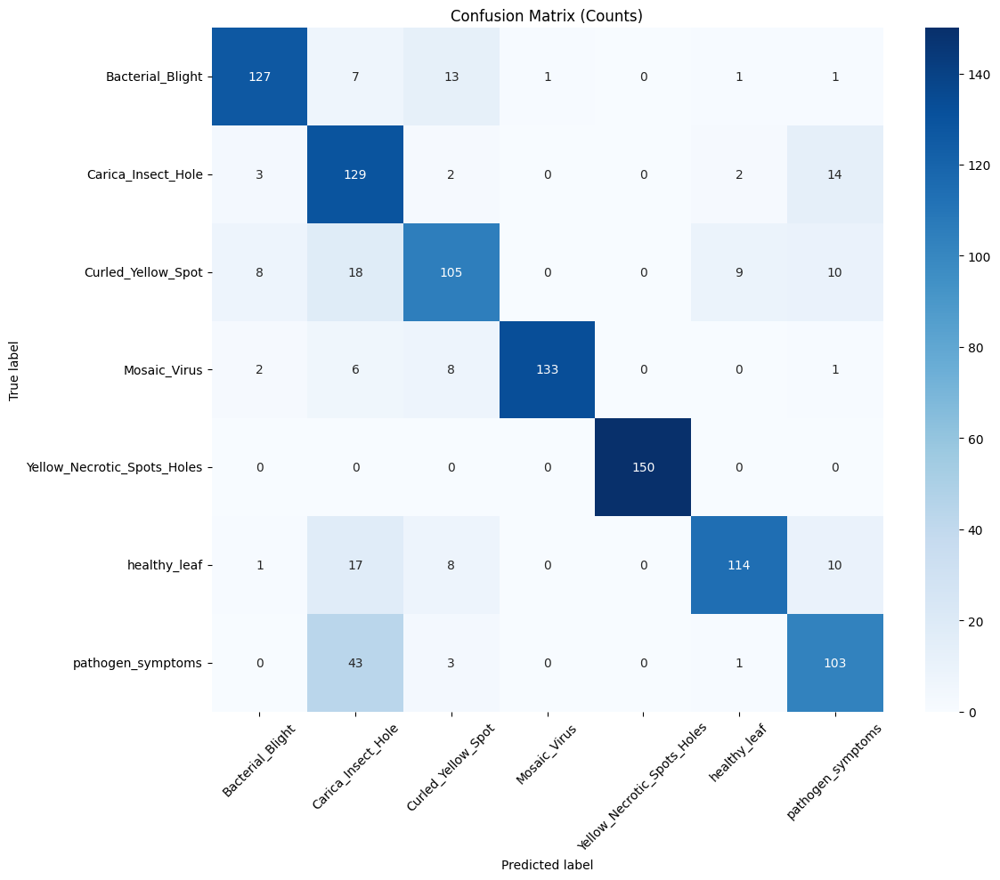

Normalized confusion matrix


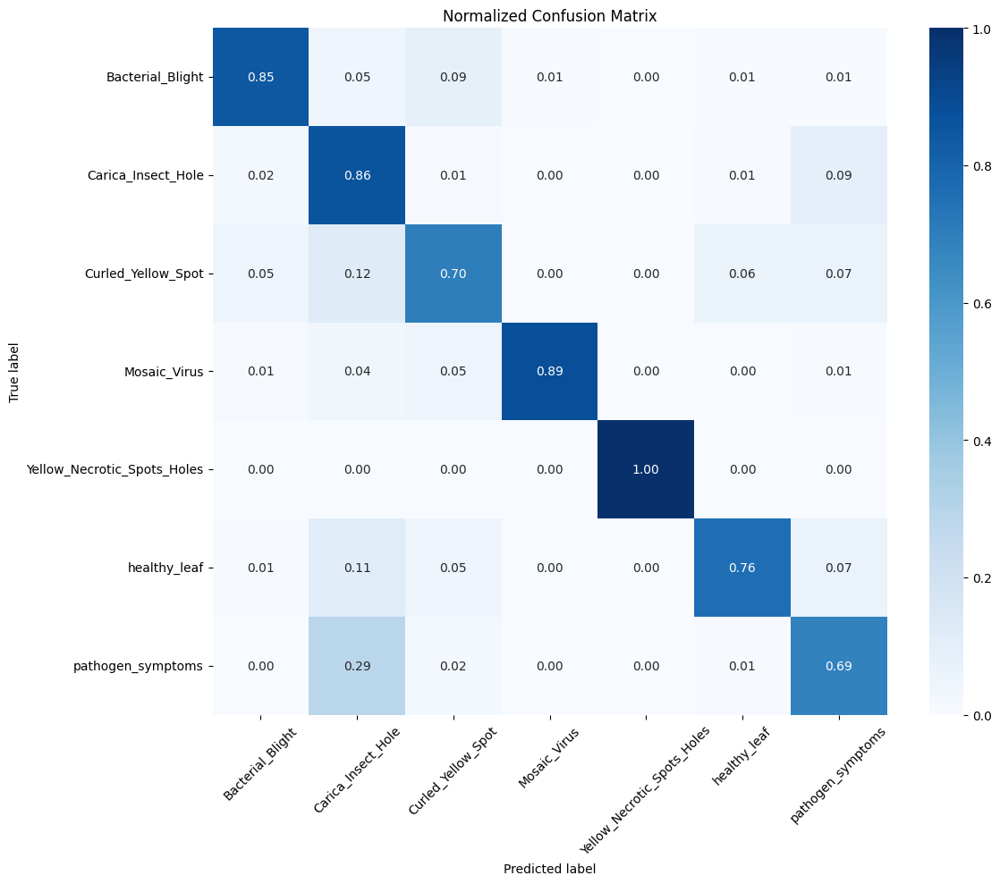

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# 1. Get predictions and true labels from test set
y_pred = model.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class indices
y_true = np.concatenate([np.argmax(y.numpy(), axis=1) for _, y in test_ds], axis=0)

# 2. Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

# 3. Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    cm = confusion_matrix(y_true, y_pred)
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd',
                cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_true, y_pred_classes, classes=class_names,
                      title='Confusion Matrix (Counts)')

# Plot normalized confusion matrix
plot_confusion_matrix(y_true, y_pred_classes, classes=class_names, normalize=True,
                      title='Normalized Confusion Matrix')

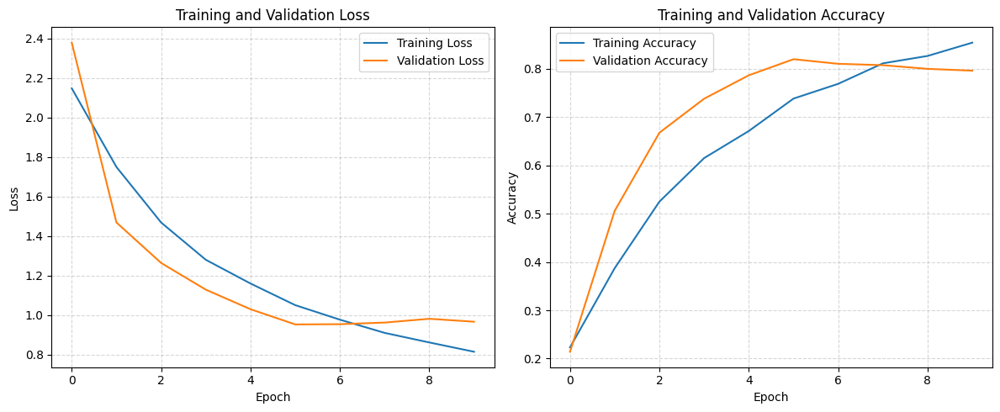


Best Validation Loss: 0.9522 at epoch 6
Corresponding Training Loss: 1.0499
Validation Accuracy at Best Epoch: 0.8202


In [13]:
import matplotlib.pyplot as plt

# Get training history from model.fit()
history = model.history.history

# Create figure with two subplots
plt.figure(figsize=(12, 5))

# 1. Plot Loss Curves
plt.subplot(1, 2, 1)
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# 2. Plot Accuracy Curves
plt.subplot(1, 2, 2)
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

# Optional: Print best validation accuracy
best_val_epoch = np.argmin(history['val_loss'])
print(f"\nBest Validation Loss: {min(history['val_loss']):.4f} at epoch {best_val_epoch + 1}")
print(f"Corresponding Training Loss: {history['loss'][best_val_epoch]:.4f}")
print(f"Validation Accuracy at Best Epoch: {history['val_accuracy'][best_val_epoch]:.4f}")

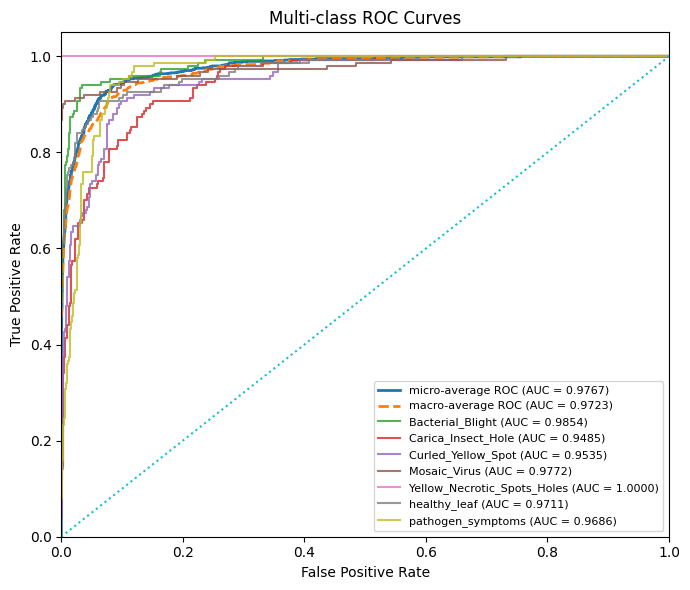

                                AUC
Yellow_Necrotic_Spots_Holes  1.0000
Bacterial_Blight             0.9854
Mosaic_Virus                 0.9772
micro                        0.9767
macro                        0.9723
healthy_leaf                 0.9711
pathogen_symptoms            0.9686
Curled_Yellow_Spot           0.9535
Carica_Insect_Hole           0.9485


In [14]:
# !pip install scikit-learn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import pandas as pd

# ====== SETTINGS: একই ফরম্যাট সবখানে ======
DECIMALS = 4          # কত ঘর পর্যন্ত দেখাবে
USE_TRUNCATION = True # True হলে 0.999607 -> 0.9996; False হলে স্ট্যান্ডার্ড রাউন্ড

def fmt(x):
    if USE_TRUNCATION:
        f = 10**DECIMALS
        x = np.floor(x * f) / f
    return f"{x:.{DECIMALS}f}"

# ====== 1) y_true (one-hot) এবং y_score (probabilities) ======
def collect_from_dataset(ds):
    y_true_list, y_score_list = [], []
    for xb, yb in ds:  # yb one-hot
        preds = model.predict(xb, verbose=0)
        y_true_list.append(yb.numpy())
        y_score_list.append(preds)
    return np.concatenate(y_true_list, 0), np.concatenate(y_score_list, 0)

y_true, y_score = collect_from_dataset(test_ds)
n_classes = y_true.shape[1]

# ====== 2) প্রতি ক্লাস, মাইক্রো, ম্যাক্রো ROC & AUC ======
fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# micro
fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# macro
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# ====== 3) নামগুলো (লেবেল অর্ডারের সঙ্গে মিলেই) ======
try:
    names = class_names  # আগের কোডে সেট করা আছে
    assert len(names) == n_classes
except:
    names = [f"Class {i}" for i in range(n_classes)]

# ====== 4) Plot (লেজেন্ডে একই fmt) ======
plt.figure(figsize=(7, 6))
plt.plot(fpr["micro"], tpr["micro"], label=f"micro-average ROC (AUC = {fmt(roc_auc['micro'])})", linewidth=2)
plt.plot(fpr["macro"], tpr["macro"], label=f"macro-average ROC (AUC = {fmt(roc_auc['macro'])})", linestyle="--", linewidth=2)

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"{names[i]} (AUC = {fmt(roc_auc[i])})", alpha=0.8)

plt.plot([0, 1], [0, 1], linestyle=":", linewidth=1.5)
plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("Multi-class ROC Curves")
plt.legend(loc="lower right", fontsize=8)
plt.tight_layout()
plt.show()

# ====== 5) AUC টেবিল (একই fmt) ======
auc_table = {names[i]: fmt(roc_auc[i]) for i in range(n_classes)}
auc_table.update({"micro": fmt(roc_auc["micro"]), "macro": fmt(roc_auc["macro"])})
auc_df = pd.DataFrame.from_dict(auc_table, orient="index", columns=["AUC"]).sort_values("AUC", ascending=False)
print(auc_df)


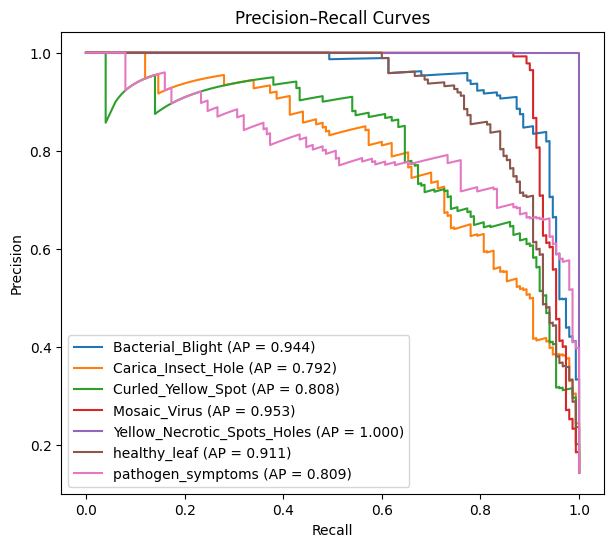

In [15]:
from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, pr_auc = {}, {}, {}
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true[:, i], y_score[:, i])
    pr_auc[i] = average_precision_score(y_true[:, i], y_score[:, i])

plt.figure(figsize=(7,6))
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f"{names[i]} (AP = {pr_auc[i]:.3f})")
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title("Precision–Recall Curves")
plt.legend()
plt.show()


Lime start

In [16]:
!pip install lime

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

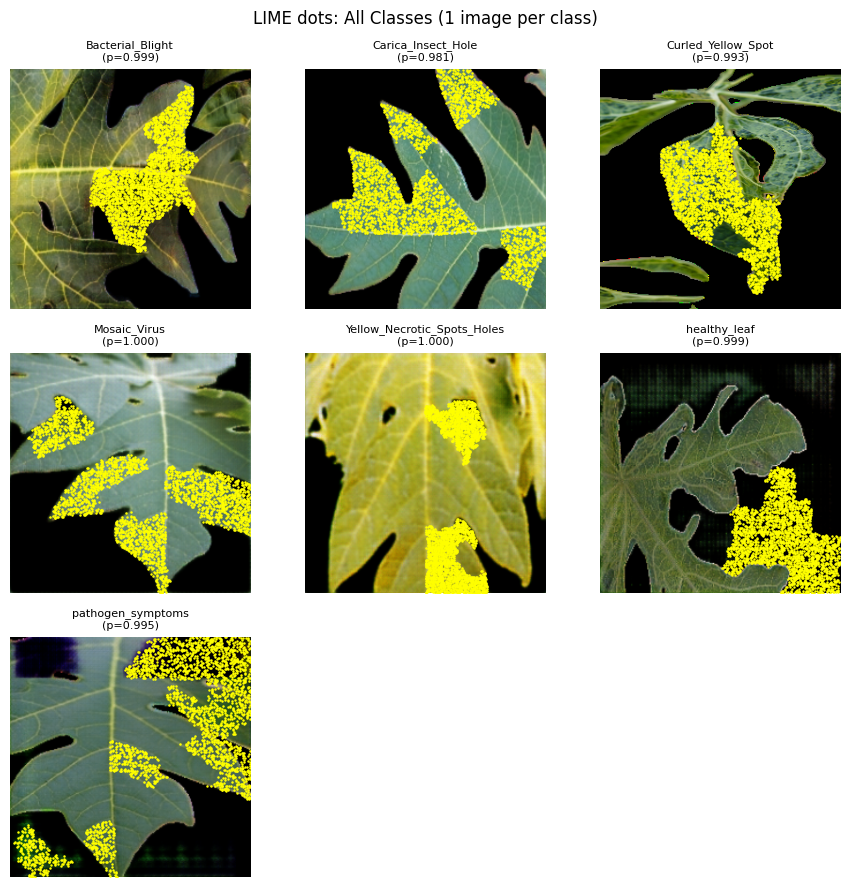

Saved: lime_allclasses_grid.png


In [20]:
# !pip install lime scikit-image
import os, math, numpy as np, matplotlib.pyplot as plt
from lime import lime_image

# ---------- Preprocess helpers ----------
def deprocess_from_mobilenet_v2(x):   # [-1,1] -> [0,1]
    return np.clip((x + 1.0) / 2.0, 0, 1)

def preprocess_for_model_from_01(x):  # [0,1] -> [-1,1]
    return (x * 2.0) - 1.0

def lime_predict(images_01):
    imgs = preprocess_for_model_from_01(images_01.astype(np.float32))
    return model.predict(imgs, verbose=0, batch_size=64)

# ---------- Pick one image per class ----------
def pick_one_index_per_class(X, y_true_int, class_count, strategy="max_conf"):
    """
    প্রতি ক্লাস থেকে ১টা index বেছে নেয়।
    strategy="first" হলে প্রথম index নেয়,
    strategy="max_conf" হলে prediction confidence সর্বোচ্চ যেটা, সেটা নেয়।
    """
    preds = model.predict(X, verbose=0, batch_size=64)  # (N, C)
    chosen = [None] * class_count

    for c in range(class_count):
        idxs = np.where(y_true_int == c)[0]
        if len(idxs) == 0:
            continue
        if strategy == "first":
            chosen[c] = idxs[0]
        else:  # max_conf
            best = idxs[np.argmax(preds[idxs, c])]
            chosen[c] = best
    return chosen, preds

# ---------- LIME sparse dots for one image ----------
def lime_dots_sparse_for_image(x_pre, label_to_explain, num_samples=1500,
                               num_features=8, min_weight=0.06,
                               max_points=3500, dot_size=0.5):
    x_vis = deprocess_from_mobilenet_v2(x_pre)  # [0,1]
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        image=x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,  
        num_samples=num_samples,
        batch_size=64
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid, w in seg_weights.items() if w >= min_weight]
    if not keep_ids:
        keep_ids = [sid for sid, w in sorted(seg_weights.items(),
                                             key=lambda t: -abs(t[1]))[:num_features]]

    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))  # (y,x)
    if len(coords) > max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# ---------- Grid for all classes ----------
def grid_all_classes(
    X_test, y_test, class_names,
    strategy="max_conf",
    num_samples=1500, num_features=8, min_weight=0.06,
    max_points=3000, dot_size=0.5,
    save_path="lime_allclasses_grid.png"
):
    y_true_int = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    # প্রতি ক্লাসে index বেছে নেয়া
    chosen_idxs_all, preds_all = pick_one_index_per_class(
        X_test, y_true_int, NUM_CLASSES, strategy=strategy
    )

    # Grid size হিসাব
    cols = int(math.ceil(math.sqrt(NUM_CLASSES)))
    rows = int(math.ceil(NUM_CLASSES / cols))

    fig = plt.figure(figsize=(3*cols, 3*rows))
    panel = 1

    for c in range(NUM_CLASSES):
        idx = chosen_idxs_all[c]
        if idx is None or idx >= len(X_test):
            continue

        x_pre = X_test[idx]

        # LIME sparse dots
        x_vis, coords = lime_dots_sparse_for_image(
            x_pre, label_to_explain=c,
            num_samples=num_samples, num_features=num_features,
            min_weight=min_weight, max_points=max_points, dot_size=dot_size
        )

        # Prediction probability
        prob = lime_predict(x_vis[None, ...])[0][c]

        ax = plt.subplot(rows, cols, panel); panel += 1
        ax.imshow(x_vis); ax.axis('off')
        if coords.size:
            ax.scatter(coords[:, 1], coords[:, 0], s=dot_size, c='yellow')
        ax.set_title(f"{class_names[c]}\n(p={prob:.3f})", fontsize=8)

    plt.suptitle("LIME dots: All Classes (1 image per class)", y=0.98)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.show()
    print("Saved:", save_path)


# -------- Run it (Hybrid model must be loaded before this) --------
grid_all_classes(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    strategy="max_conf",       # প্রতি ক্লাসে সর্বোচ্চ confidence ইমেজ
    num_samples=1500,
    num_features=8,
    min_weight=0.08,
    max_points=2500,
    dot_size=0.6,
    save_path="lime_allclasses_grid.png"
)


Grad cam start

✅ Using last conv layer: proj_low


  0%|          | 0/1000 [00:00<?, ?it/s]

2026-01-14 19:57:06.542528: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_47', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:57:06.912097: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_39', 64 bytes spill stores, 64 bytes spill loads

2026-01-14 19:57:07.883731: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_7', 68 bytes spill stores, 68 bytes spill loads

2026-01-14 19:57:08.027694: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_6', 8 bytes spill stores, 8 bytes spill loads

2026-01-14 19:57:08.136738: I external/local_xla/xla/s

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

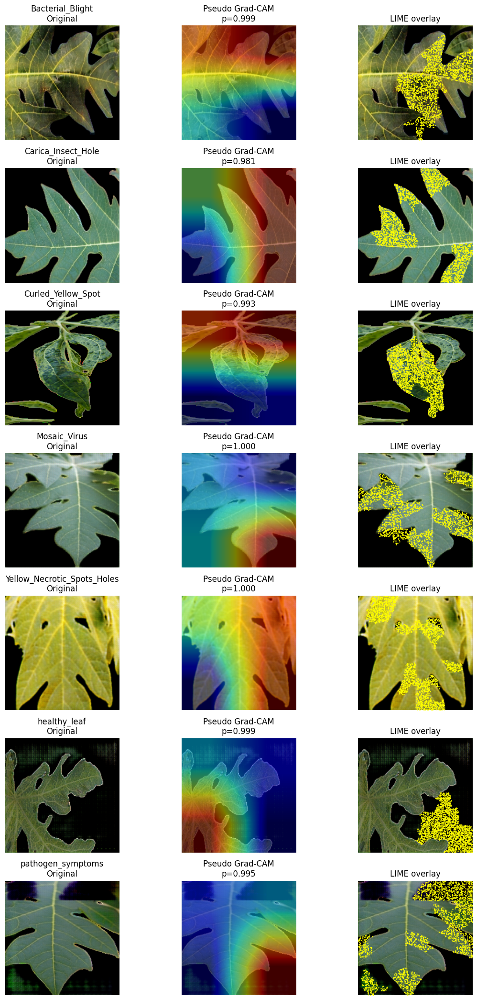

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess function
# -----------------------
def denormalize(img):
    """[-1,1] → 0..255 uint8"""
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 Auto-detect last conv layer
# -----------------------
def get_last_conv_layer_name(model):
    conv_layers = [layer.name for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]
    if not conv_layers:
        raise ValueError("❌ No Conv2D layer found in the model.")
    return conv_layers[-1]  # শেষ conv layer return করবে

# -----------------------
# 🔹 Pseudo Grad-CAM
# -----------------------
def pseudo_gradcam(model, img_array, last_conv_layer_name=None):
    """
    Approximate Grad-CAM without gradient.
    Uses CNN activations and predicted softmax weight.
    """
    # Auto detect last conv layer if not given
    if last_conv_layer_name is None:
        last_conv_layer_name = get_last_conv_layer_name(model)

    # Get CNN feature map
    backbone_layer = model.get_layer(last_conv_layer_name)
    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)  # (1,H,W,C)
    feature_map = feature_map[0].numpy()         # (H,W,C)

    # Get predicted probabilities
    preds = model.predict(img_array, verbose=0)
    class_idx = np.argmax(preds[0])
    pred_prob = preds[0, class_idx]

    # Weight channels by predicted probability
    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 LIME
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Main Dashboard
# -----------------------
def plot_hybrid_pseudocam(X_test, y_test, class_names, last_conv_layer_name=None):
    """
    X_test: (num_samples,H,W,3), [-1,1] input
    y_test: (num_samples,) or one-hot
    """
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    # Model predictions
    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(3):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- Pseudo Grad-CAM ----
        heatmap, class_idx, pred_prob = pseudo_gradcam(model, img_array, last_conv_layer_name=last_conv_layer_name)
        heatmap_resized = tf.image.resize(np.expand_dims(heatmap,-1),(orig.shape[0],orig.shape[1])).numpy().squeeze()

        # ---- LIME ----
        x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)

        # ---- Plot Original ----
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal")
        axes[i,0].axis('off')

        # ---- Plot Pseudo Grad-CAM ----
        axes[i,1].imshow(orig)
        axes[i,1].imshow(heatmap_resized, cmap="jet", alpha=0.5)
        axes[i,1].set_title(f"Pseudo Grad-CAM\np={preds_all[idx,c]:.3f}")
        axes[i,1].axis('off')

        # ---- Plot LIME ----
        axes[i,2].imshow(x_vis)
        if coords.size:
            axes[i,2].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,2].set_title("LIME overlay")
        axes[i,2].axis('off')

    plt.tight_layout()
    plt.show()


# -----------------------
# 🔹 Run
# -----------------------
# Auto-detect last conv layer
last_conv = get_last_conv_layer_name(model)
print(f"✅ Using last conv layer: {last_conv}")

plot_hybrid_pseudocam(
    X_test=X_test, 
    y_test=y_test, 
    class_names=class_names, 
    last_conv_layer_name=last_conv
)


Vit_Attention start

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess function
# -----------------------
def denormalize(img):
    """[-1,1] → 0..255 uint8"""
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 Pseudo ViT Attention Map
# -----------------------
def pseudo_vit_attention(model, img_array, patch_layer_name="seq_from_high"):
    """
    Approximate ViT attention map using CLS token attention.
    """
    # Extract patch embeddings (sequence) from model
    try:
        patch_layer = model.get_layer(patch_layer_name)
    except:
        raise ValueError(f"Layer '{patch_layer_name}' not found in model!")

    intermediate_model = tf.keras.models.Model(model.input, patch_layer.output)
    seq = intermediate_model(img_array)  # (1, N+1, D)

    # CLS token is first token
    cls_token = seq[:,0:1,:]  # (1,1,D)
    patch_tokens = seq[:,1:,:]  # (1,N,D)

    # Compute simple attention weights (cosine similarity)
    attn_weights = tf.reduce_sum(cls_token * patch_tokens, axis=-1)  # (1,N)
    attn_weights = attn_weights.numpy().squeeze()
    attn_weights = (attn_weights - attn_weights.min())/(attn_weights.max()-attn_weights.min()+1e-6)

    # Reshape to square image approximation
    N = patch_tokens.shape[1]
    size = int(np.sqrt(N))
    attn_map = attn_weights[:size*size].reshape(size, size)
    attn_map = tf.image.resize(np.expand_dims(attn_map,-1),(img_array.shape[1], img_array.shape[2])).numpy().squeeze()
    pred_prob = np.max(model.predict(img_array, verbose=0))
    pred_idx = np.argmax(model.predict(img_array, verbose=0)[0])
    return attn_map, pred_idx, pred_prob

# -----------------------
# 🔹 LIME overlay
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Main ViT plot function
# -----------------------
def plot_vit_attention(X_test, y_test, class_names, patch_layer_name="seq_from_high"):
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)

    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(3):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- Pseudo ViT Attention Map ----
        attn_map, class_idx, pred_prob = pseudo_vit_attention(model, img_array, patch_layer_name)
        
        # ---- LIME overlay ----
        x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)

        # ---- Plot Original ----
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal")
        axes[i,0].axis('off')

        # ---- Plot ViT Attention Map ----
        axes[i,1].imshow(orig)
        axes[i,1].imshow(attn_map, cmap="jet", alpha=0.5)
        axes[i,1].set_title(f"ViT Attention\np={preds_all[idx,c]:.3f}")
        axes[i,1].axis('off')

        # ---- Plot LIME overlay ----
        axes[i,2].imshow(x_vis)
        if coords.size:
            axes[i,2].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,2].set_title("LIME overlay")
        axes[i,2].axis('off')

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

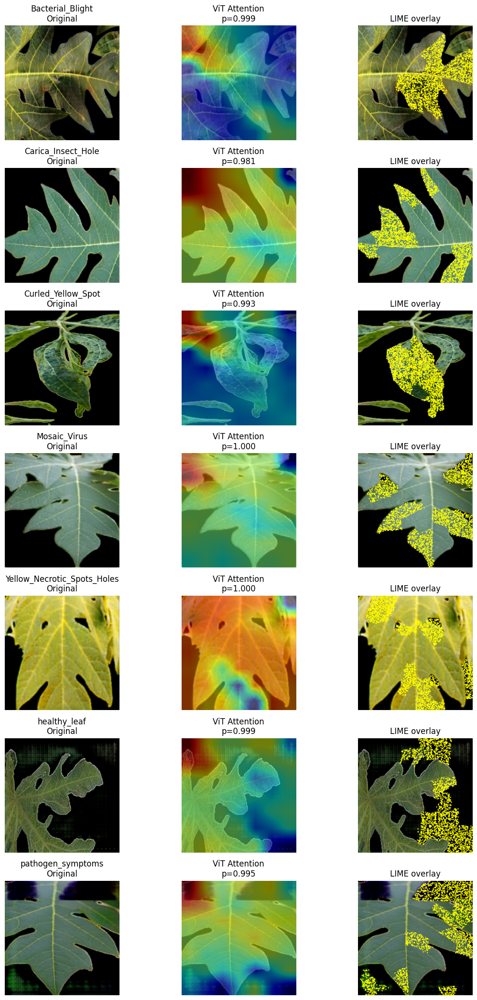

In [23]:
plot_vit_attention(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    patch_layer_name="seq_from_high"  # ViT token layer
)


LIME,Grad CAM, Grad CAM++,ViT Attention (ALL)


Using last conv layer: proj_low
Using patch-sequence layer: seq_from_high


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

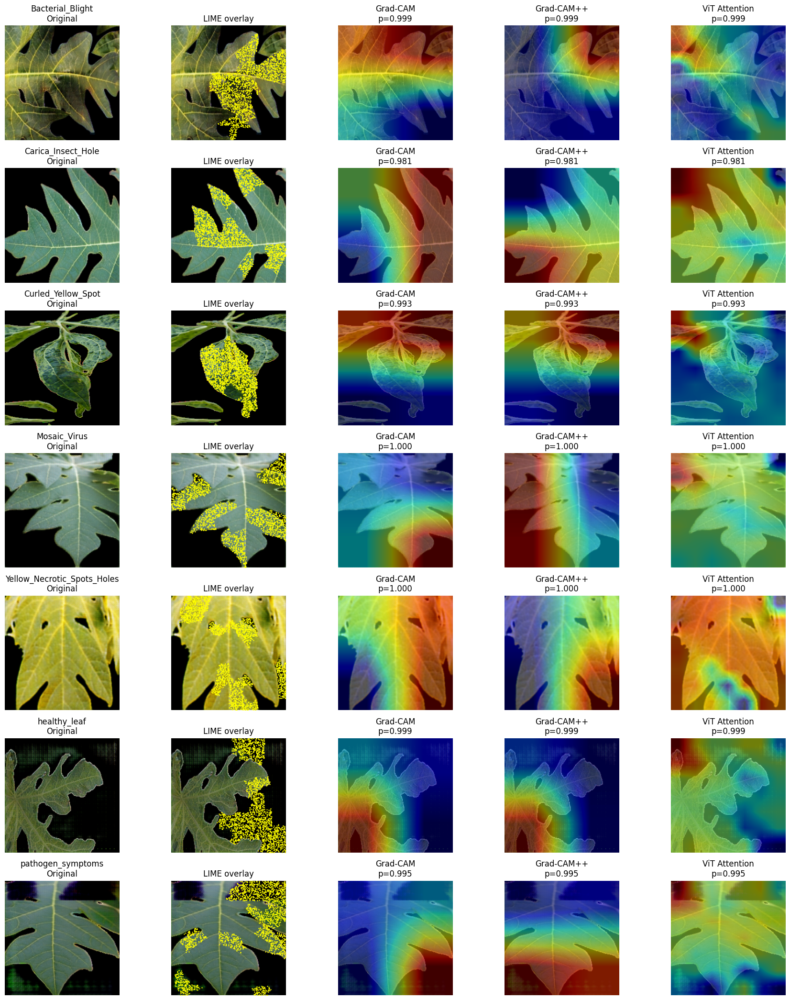

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image

# -----------------------
# 🔹 Deprocess
# -----------------------
def denormalize(img):
    img = img.copy()
    if img.min() < -0.1:  # [-1,1]
        img = (img + 1)/2
    img = np.clip(img*255,0,255).astype("uint8")
    return img

# -----------------------
# 🔹 Helpers: auto-detect layers
# -----------------------
def get_last_conv_layer_name(model):
    conv_layers = [layer.name for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]
    if not conv_layers:
        raise ValueError("❌ No Conv2D layer found in the model.")
    return conv_layers[-1]

def get_patch_sequence_layer_name(model):
    # Prefer common names, else find first layer with rank 3/ or shape (batch, N, D)
    candidates = ["seq_from_high", "patch_embeddings", "patch_proj", "encoder_tokens"]
    for cand in candidates:
        try:
            model.get_layer(cand)
            return cand
        except Exception:
            continue

    # fallback: find any layer whose output has rank 3 (batch, N, dim)
    for layer in model.layers[::-1]:
        try:
            out_shape = layer.output_shape
            # some layers may have tuple shapes like (None, N, D)
            if isinstance(out_shape, tuple) and len(out_shape) == 3:
                return layer.name
        except Exception:
            continue

    raise ValueError("❌ Could not auto-detect a patch-sequence (ViT) layer. Provide patch_layer_name explicitly.")

# -----------------------
# 🔹 LIME overlay
# -----------------------
def lime_predict(images_01):
    imgs = (images_01*2)-1   # assuming image inputs to lime are [0,1] -> convert to model input range [-1,1]
    return model.predict(imgs, verbose=0, batch_size=32)

def lime_dots_sparse(x_pre, label_to_explain, num_samples=1000, num_features=8, min_weight=0.06, max_points=2000):
    x_vis = np.clip((x_pre+1)/2,0,1)
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(
        x_vis.astype(np.float32),
        classifier_fn=lime_predict,
        top_labels=label_to_explain+1,
        num_samples=num_samples,
        batch_size=32
    )
    seg_weights = dict(exp.local_exp[label_to_explain])
    seg_map = exp.segments
    keep_ids = [sid for sid,w in seg_weights.items() if w>=min_weight]
    if not keep_ids:
        keep_ids = [sid for sid,w in sorted(seg_weights.items(), key=lambda t:-abs(t[1]))[:num_features]]
    coords = np.column_stack(np.where(np.isin(seg_map, keep_ids)))
    if len(coords)>max_points:
        sel = np.random.choice(len(coords), max_points, replace=False)
        coords = coords[sel]
    return x_vis, coords

# -----------------------
# 🔹 Pseudo Grad-CAM (robust)
# -----------------------
def pseudo_gradcam(model, img_array, last_conv_layer_name=None):
    """
    img_array: (1,H,W,3) in model input range (e.g., [-1,1])
    returns: heatmap (Hf,Wf), class_idx, pred_prob
    """
    if last_conv_layer_name is None:
        last_conv_layer_name = get_last_conv_layer_name(model)

    try:
        backbone_layer = model.get_layer(last_conv_layer_name)
    except Exception:
        raise ValueError(f"Layer '{last_conv_layer_name}' not found in model!")

    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)[0].numpy()  # (Hf,Wf,Cf)

    preds = model.predict(img_array, verbose=0)
    class_idx = int(np.argmax(preds[0]))
    pred_prob = float(np.max(preds[0]))

    # simple channel weighting by predicted probability (pseudo)
    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min())/(heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 Pseudo Grad-CAM++ (robust)
# -----------------------
def pseudo_gradcam_plus(model, img_array, last_conv_layer_name=None):
    if last_conv_layer_name is None:
        last_conv_layer_name = get_last_conv_layer_name(model)

    try:
        backbone_layer = model.get_layer(last_conv_layer_name)
    except Exception:
        raise ValueError(f"Layer '{last_conv_layer_name}' not found in model!")

    intermediate_model = tf.keras.models.Model(model.input, backbone_layer.output)
    feature_map = intermediate_model(img_array)[0].numpy()  # (Hf,Wf,Cf)
    feature_map_sq = feature_map ** 2

    preds = model.predict(img_array, verbose=0)
    class_idx = int(np.argmax(preds[0]))
    pred_prob = float(np.max(preds[0]))

    weights = np.ones(feature_map.shape[-1]) * pred_prob
    heatmap = np.sum(feature_map_sq * weights[np.newaxis, np.newaxis, :], axis=-1)
    heatmap = (heatmap - heatmap.min())/(heatmap.max()-heatmap.min()+1e-6)
    return heatmap, class_idx, pred_prob

# -----------------------
# 🔹 ViT Attention Map (robust)
# -----------------------
def pseudo_vit_attention(model, img_array, patch_layer_name=None):
    if patch_layer_name is None:
        patch_layer_name = get_patch_sequence_layer_name(model)

    try:
        patch_layer = model.get_layer(patch_layer_name)
    except Exception:
        raise ValueError(f"Layer '{patch_layer_name}' not found in model!")

    intermediate_model = tf.keras.models.Model(model.input, patch_layer.output)
    seq = intermediate_model(img_array)  # expected shape (1, N+1, D) or (1,N,D)
    seq_np = seq.numpy()
    if seq_np.ndim != 3:
        raise ValueError(f"Patch-sequence layer output must be 3D (batch, N, D). Got shape {seq_np.shape}")

    # handle case where there's no explicit CLS token (then we approximate by mean)
    if seq_np.shape[1] >= 2:
        cls_token = seq_np[:,0:1,:]  # (1,1,D)
        patch_tokens = seq_np[:,1:,:]  # (1,N,D)
    else:
        # unlikely, but fallback: use mean as cls
        cls_token = np.mean(seq_np, axis=1, keepdims=True)  # (1,1,D)
        patch_tokens = seq_np  # (1,N,D)

    # cosine-like similarity (dot product then normalize)
    attn_weights = np.sum(cls_token * patch_tokens, axis=-1).squeeze()  # (N,)
    attn_weights = (attn_weights - attn_weights.min())/(attn_weights.max()-attn_weights.min()+1e-6)

    N = patch_tokens.shape[1]
    size = int(np.sqrt(N))
    if size*size != N:
        # if N not perfect square, try nearest square smaller than N
        size = int(np.floor(np.sqrt(N)))
        N2 = size*size
        attn_weights = attn_weights[:N2]
    else:
        N2 = N

    attn_map = attn_weights[:size*size].reshape(size, size)
    attn_map = tf.image.resize(np.expand_dims(attn_map,-1),(img_array.shape[1], img_array.shape[2])).numpy().squeeze()

    preds = model.predict(img_array, verbose=0)
    pred_prob = float(np.max(preds[0]))
    class_idx = int(np.argmax(preds[0]))
    return attn_map, class_idx, pred_prob

# -----------------------
# 🔹 Hybrid Visualization (integrated & robust)
# -----------------------
def plot_hybrid_visual(X_test, y_test, class_names, last_conv_layer_name=None, patch_layer_name=None):
    """
    X_test: ndarray of shape (num, H, W, 3) WITHIN model input range (e.g., [-1,1])
    y_test: (num,) ints OR one-hot (num, C)
    """
    # convert y to int labels if one-hot
    y_true_int = y_test if y_test.ndim==1 else np.argmax(y_test, axis=1)
    NUM_CLASSES = len(class_names)
    preds_all = model.predict(X_test, verbose=0, batch_size=32)

    # auto-detect if needed
    if last_conv_layer_name is None:
        last_conv_layer_name = get_last_conv_layer_name(model)
    if patch_layer_name is None:
        # try but allow failure later inside function
        try:
            patch_layer_name = get_patch_sequence_layer_name(model)
        except Exception:
            patch_layer_name = None

    # Pick one image per class (max confidence)
    chosen_idxs = []
    for c in range(NUM_CLASSES):
        idxs = np.where(y_true_int==c)[0]
        if len(idxs)==0:
            chosen_idxs.append(None)
        else:
            best = idxs[np.argmax(preds_all[idxs,c])]
            chosen_idxs.append(best)

    fig, axes = plt.subplots(NUM_CLASSES, 5, figsize=(18, NUM_CLASSES*3))
    if NUM_CLASSES==1:
        axes = np.expand_dims(axes,0)

    for i, c in enumerate(range(NUM_CLASSES)):
        idx = chosen_idxs[c]
        if idx is None:
            for j in range(5):
                axes[i,j].axis('off')
            continue

        img_array = np.expand_dims(X_test[idx],0)
        orig = denormalize(X_test[idx])

        # ---- LIME ----
        try:
            x_vis, coords = lime_dots_sparse(X_test[idx], label_to_explain=c)
        except Exception as e:
            x_vis = np.clip((X_test[idx]+1)/2,0,1)
            coords = np.empty((0,2))
            print(f"Warning: LIME failed for idx {idx}: {e}")

        # ---- Grad-CAM ----
        try:
            heatmap1, _, prob1 = pseudo_gradcam(model, img_array, last_conv_layer_name=last_conv_layer_name)
        except Exception as e:
            heatmap1 = np.zeros((orig.shape[0]//8, orig.shape[1]//8))  # placeholder
            prob1 = 0.0
            print(f"Warning: Grad-CAM failed: {e}")

        # ---- Grad-CAM++ ----
        try:
            heatmap2, _, prob2 = pseudo_gradcam_plus(model, img_array, last_conv_layer_name=last_conv_layer_name)
        except Exception as e:
            heatmap2 = np.zeros_like(heatmap1)
            prob2 = 0.0
            print(f"Warning: Grad-CAM++ failed: {e}")

        # ---- ViT Attention ----
        try:
            attn_map, _, prob3 = pseudo_vit_attention(model, img_array, patch_layer_name=patch_layer_name)
        except Exception as e:
            attn_map = np.zeros((orig.shape[0], orig.shape[1]))
            prob3 = 0.0
            print(f"Info: ViT-attention not available or failed: {e}")

        # ---- Plot Columns ----
        # Original
        axes[i,0].imshow(orig)
        axes[i,0].set_title(f"{class_names[c]}\nOriginal")
        axes[i,0].axis('off')

        # LIME
        axes[i,1].imshow(x_vis)
        if coords.size:
            axes[i,1].scatter(coords[:,1], coords[:,0], s=0.5, c='yellow')
        axes[i,1].set_title("LIME overlay")
        axes[i,1].axis('off')

        # Grad-CAM
        h1 = tf.image.resize(np.expand_dims(heatmap1,-1),(orig.shape[0], orig.shape[1])).numpy().squeeze()
        axes[i,2].imshow(orig)
        axes[i,2].imshow(h1, cmap="jet", alpha=0.5)
        axes[i,2].set_title(f"Grad-CAM\np={prob1:.3f}")
        axes[i,2].axis('off')

        # Grad-CAM++
        h2 = tf.image.resize(np.expand_dims(heatmap2,-1),(orig.shape[0], orig.shape[1])).numpy().squeeze()
        axes[i,3].imshow(orig)
        axes[i,3].imshow(h2, cmap="jet", alpha=0.5)
        axes[i,3].set_title(f"Grad-CAM++\np={prob2:.3f}")
        axes[i,3].axis('off')

        # ViT Attention
        axes[i,4].imshow(orig)
        axes[i,4].imshow(attn_map, cmap="jet", alpha=0.5)
        axes[i,4].set_title(f"ViT Attention\np={prob3:.3f}")
        axes[i,4].axis('off')

    plt.tight_layout()
    plt.show()

# -----------------------
# 🔹 Example run
# -----------------------
# Auto-detect names and run (will print warnings if something missing)
try:
    last_conv = get_last_conv_layer_name(model)
    print(f"Using last conv layer: {last_conv}")
except Exception as e:
    print(f"Conv-layer auto-detect failed: {e}")
    last_conv = None

try:
    patch_layer = get_patch_sequence_layer_name(model)
    print(f"Using patch-sequence layer: {patch_layer}")
except Exception as e:
    print(f"Patch-sequence auto-detect: {e}")
    patch_layer = None

# Now run the visualization
plot_hybrid_visual(
    X_test=X_test,
    y_test=y_test,
    class_names=class_names,
    last_conv_layer_name=last_conv,
    patch_layer_name=patch_layer
)
